<a href="https://colab.research.google.com/github/NishatVasker/CSE303_Statics_for_data-science/blob/main/XAI_cse303.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pandas scikit-learn shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 5.4 MB/s eta 0:00:00


# Analysis and Interpretation
**EDA:** The EDA part will provide insights into the distribution of various features and their relationships. This can help identify patterns, outliers, or anomalies in the dataset.

**Model Performance:** The accuracy and classification report will tell how well the model is performing.

**SHAP Analysis:** The SHAP summary plot will show which features are most important in predicting the target variable. This can give you insights into what factors are most influential in consumer behavior regarding sustainable apparel.

Basic Statistics:
        QA 1: What is your gender?   What is your age?   \
count                    384.000000          384.000000   
mean                       1.658854            1.541667   
std                        0.474713            0.749819   
min                        1.000000            1.000000   
25%                        1.000000            1.000000   
50%                        2.000000            1.000000   
75%                        2.000000            2.000000   
max                        2.000000            4.000000   

       What is your highest level of education completed?  \
count                                         384.000000    
mean                                            1.921875    
std                                             1.081118    
min                                             1.000000    
25%                                             1.000000    
50%                                             1.000000    
75%                    

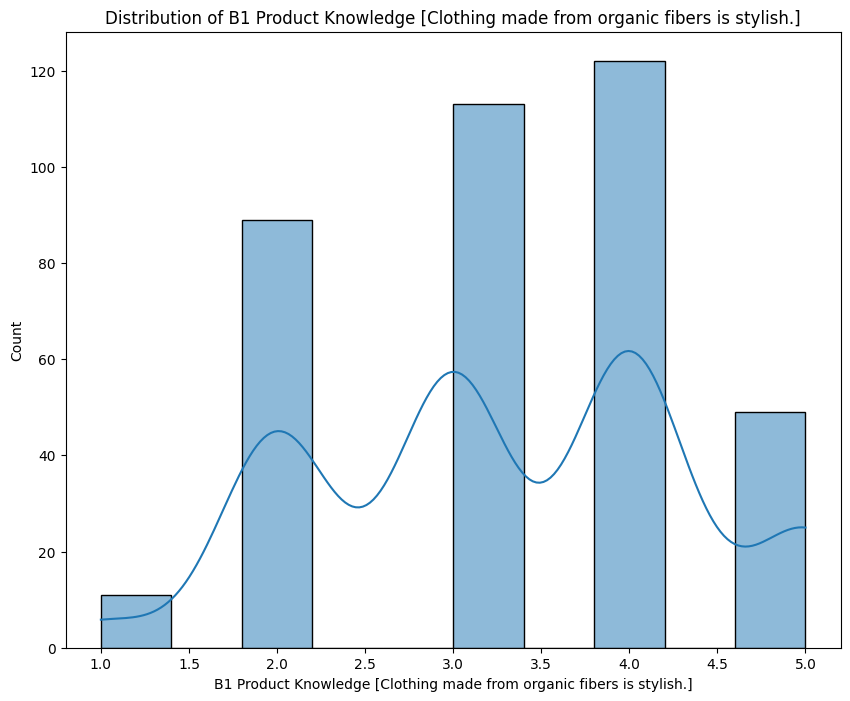

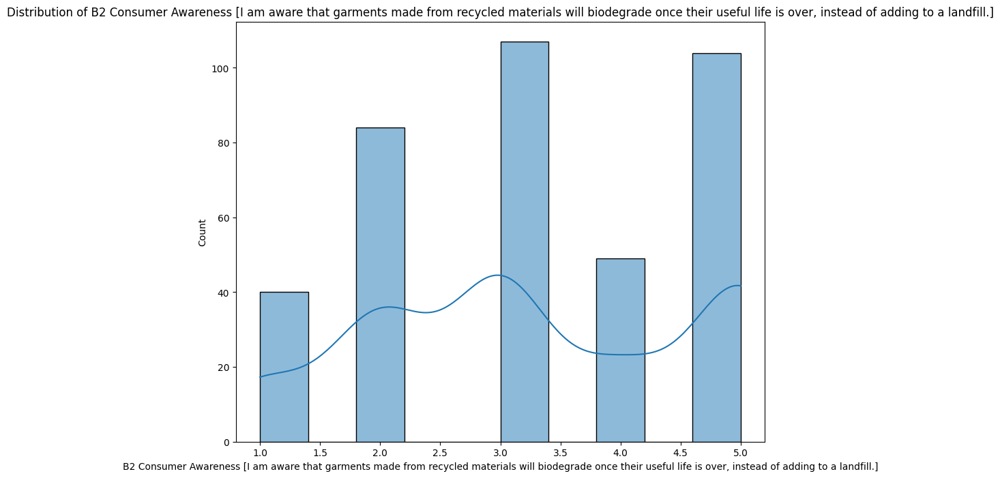

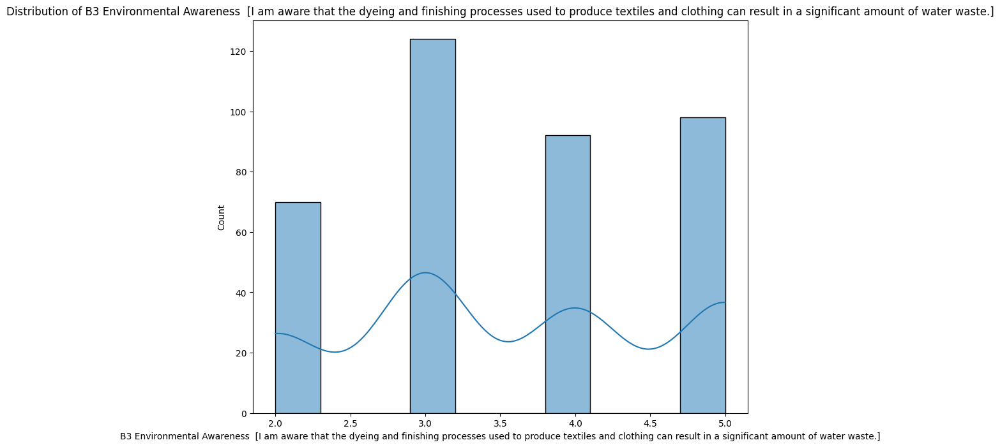

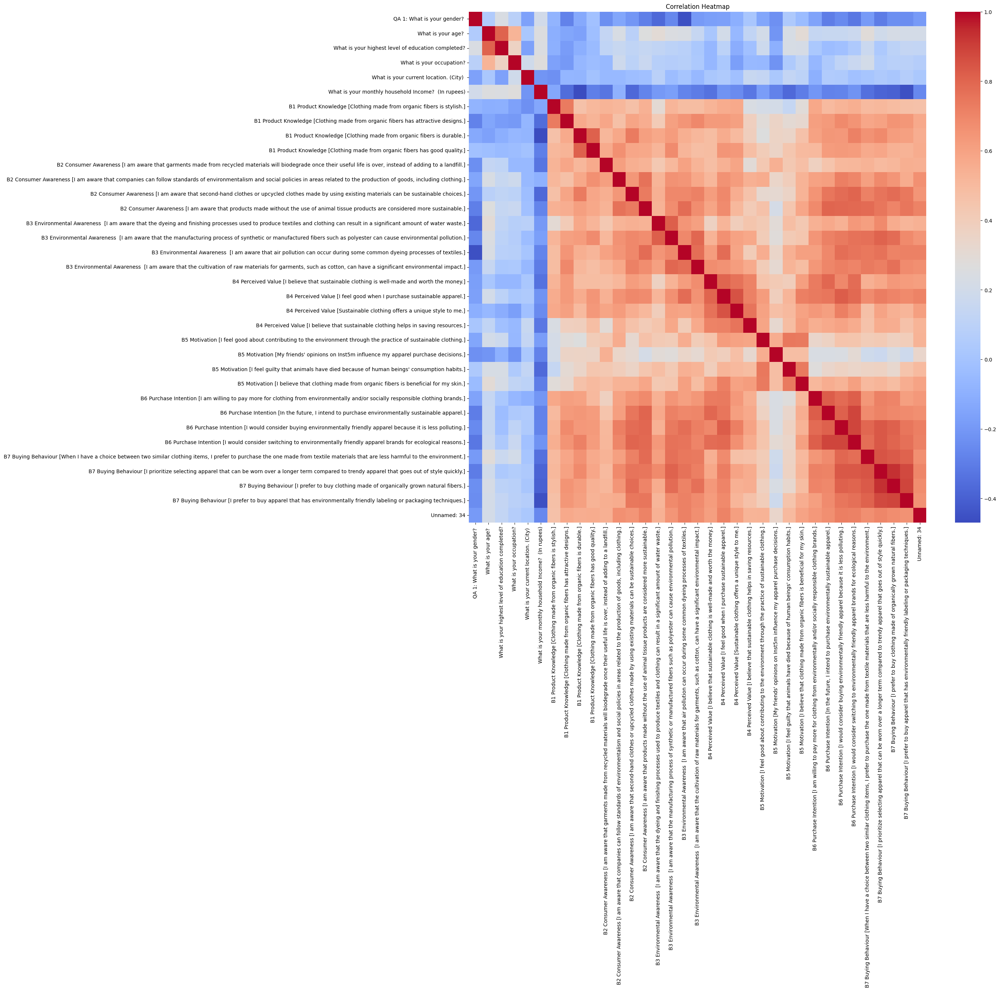

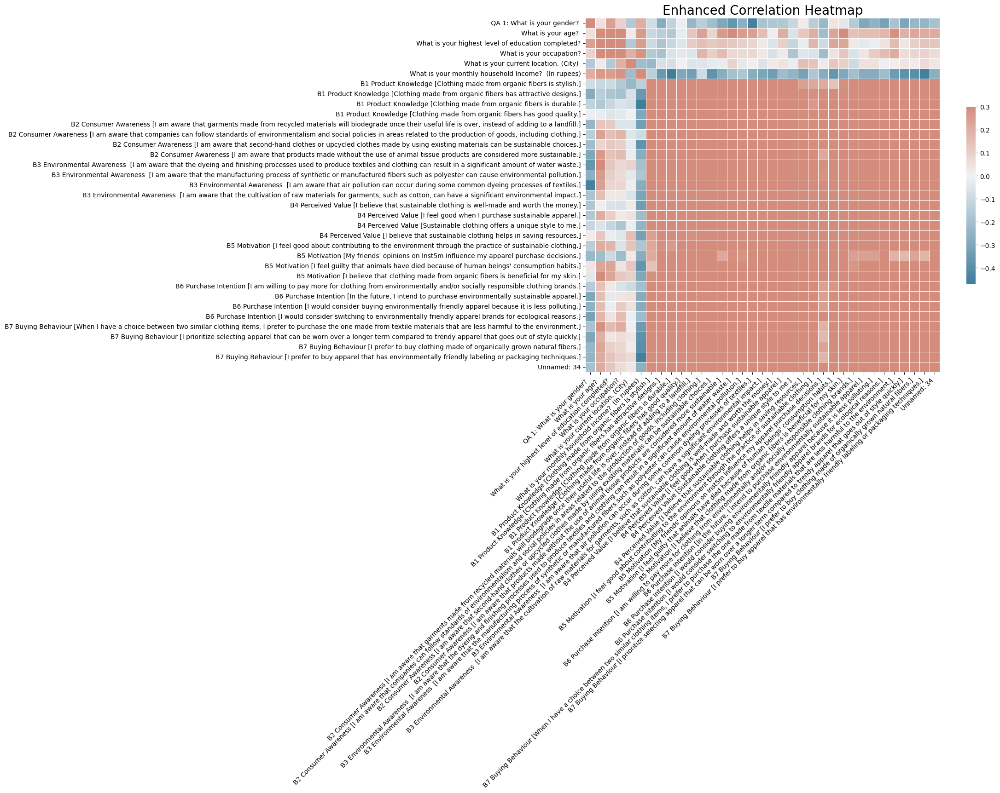

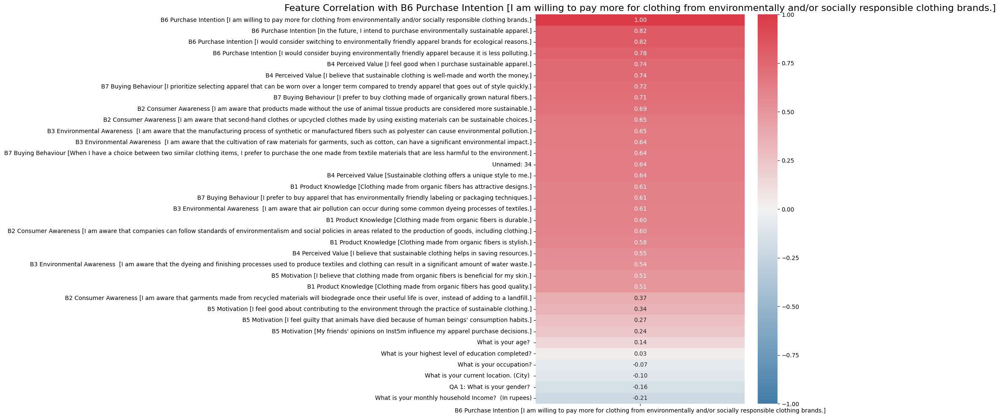

In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Display basic statistics
print("Basic Statistics:")
print(response_data.describe())

# Plotting distributions of a few selected features
selected_features = ['B1 Product Knowledge [Clothing made from organic fibers is stylish.]',
                     'B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]',
                     'B3 Environmental Awareness  [I am aware that the dyeing and finishing processes used to produce textiles and clothing can result in a significant amount of water waste.]'
                    ]

for feature in selected_features:
    plt.figure(figsize=(10,8))
    sns.histplot(response_data[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Correlation heatmap
plt.figure(figsize=(20, 18))
sns.heatmap(response_data.corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()









import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Calculate the correlation matrix
corr = response_data.corr()

# Set up the matplotlib figure
plt.figure(figsize=(15, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)

plt.title('Enhanced Correlation Heatmap', fontsize=20)
plt.xticks(fontsize=10, rotation=45, ha='right')
plt.yticks(fontsize=10)
plt.show()


import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Calculate the correlation matrix
corr = response_data.corr()

# Choose a target variable for XAI emphasis
target_variable = 'B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]'

# Highlighting the correlations related to the target variable
target_corr = corr[[target_variable]].sort_values(by=target_variable, ascending=False)

# Set up the matplotlib figure
plt.figure(figsize=(8, 12))

# Generate a color map
cmap = sns.diverging_palette(240, 10, as_cmap=True)

# Draw the heatmap
sns.heatmap(target_corr, cmap=cmap, annot=True, fmt=".2f", cbar=True, vmin=-1, vmax=1)

plt.title(f'Feature Correlation with {target_variable}', fontsize=16)
plt.show()



Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


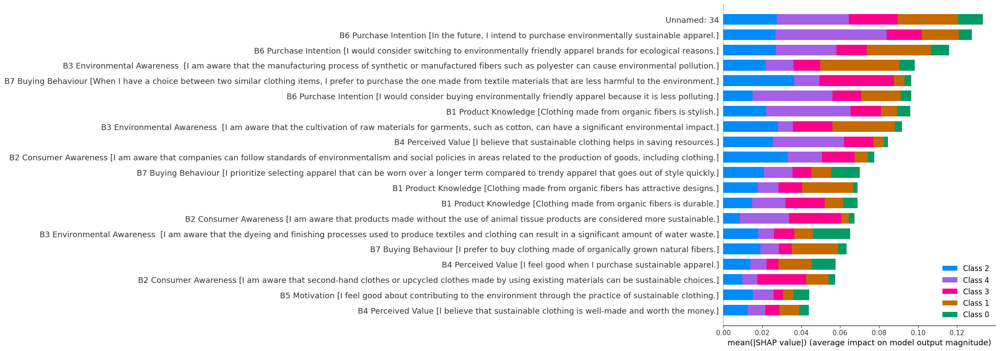

In [30]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
import shap

# Define the target variable
target = 'B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]'

# Prepare the data
X = response_data.drop(columns=target)
y = response_data[target]

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# SHAP for Explainability
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())


In [8]:
import pandas as pd

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Print the column names to verify the target column names
print("Column Names in the Dataset:")
print(response_data.columns.tolist())


Column Names in the Dataset:
[' QA 1: What is your gender? ', 'What is your age? ', 'What is your highest level of education completed?', 'What is your occupation?', 'What is your current location. (City) ', 'What is your monthly household Income?  (In rupees)', 'B1 Product Knowledge [Clothing made from organic fibers is stylish.]', 'B1 Product Knowledge [Clothing made from organic fibers has attractive designs.]', 'B1 Product Knowledge [Clothing made from organic fibers is durable.]', 'B1 Product Knowledge [Clothing made from organic fibers has good quality.]', 'B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]', 'B2 Consumer Awareness [I am aware that companies can follow standards of environmentalism and social policies in areas related to the production of goods, including clothing.]', 'B2 Consumer Awareness [I am aware that second-hand clothes or upcycled clothes made by us


Model for B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



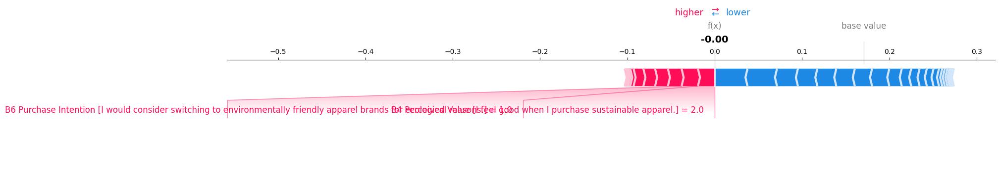


Model for B6 Purchase Intention [In the future, I intend to purchase environmentally sustainable apparel.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        27

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



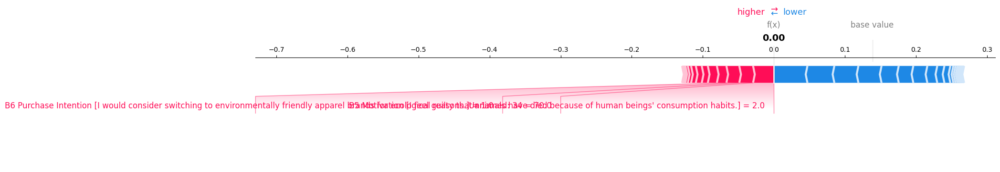


Model for B7 Buying Behaviour [When I have a choice between two similar clothing items, I prefer to purchase the one made from textile materials that are less harmful to the environment.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        27
           4       1.00      1.00      1.00        16
           5       1.00      1.00      1.00        21

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



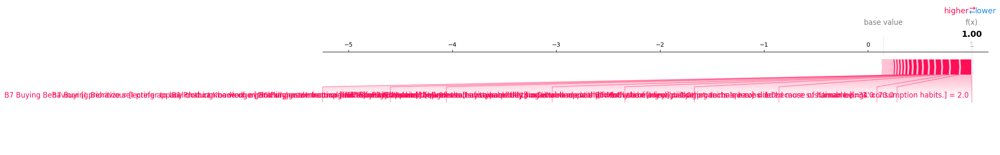


Model for B7 Buying Behaviour [I prefer to buy clothing made of organically grown natural fibers.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00        15
           3       1.00      1.00      1.00        22
           4       1.00      1.00      1.00        10
           5       1.00      1.00      1.00        29

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



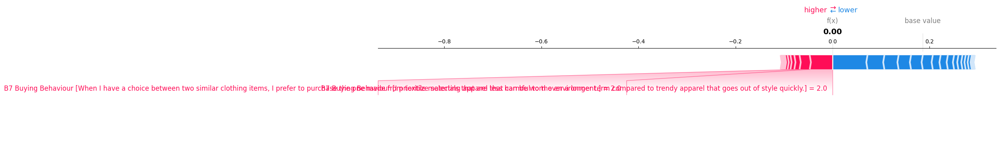


Model for B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00         8
           5       1.00      1.00      1.00        22

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



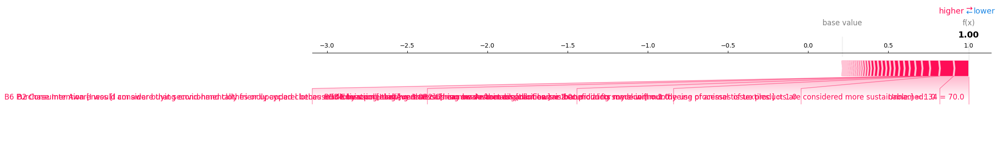


Model for B2 Consumer Awareness [I am aware that companies can follow standards of environmentalism and social policies in areas related to the production of goods, including clothing.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        19
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



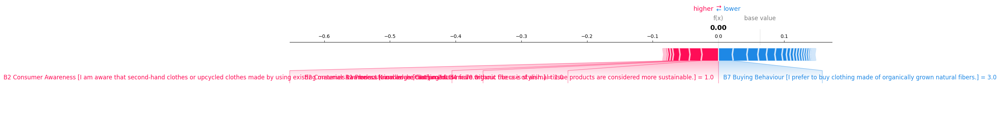


Model for B3 Environmental Awareness  [I am aware that the dyeing and finishing processes used to produce textiles and clothing can result in a significant amount of water waste.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00         9
           3       1.00      1.00      1.00        30
           4       1.00      1.00      1.00        20
           5       1.00      1.00      1.00        18

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



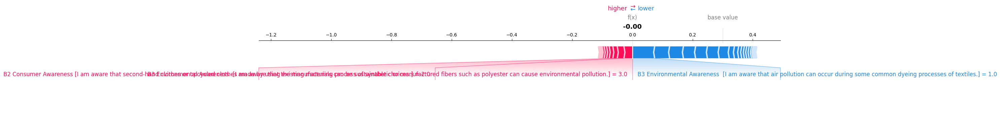


Model for B3 Environmental Awareness  [I am aware that the manufacturing process of synthetic or manufactured fibers such as polyester can cause environmental pollution.]
Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        14
           4       1.00      1.00      1.00        12
           5       1.00      1.00      1.00        28

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



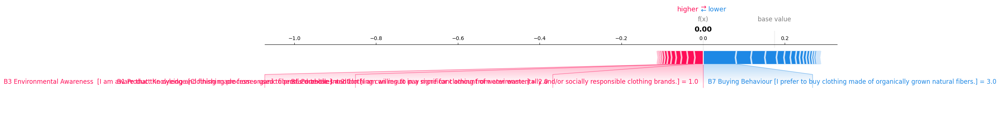

In [10]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import shap

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Drop columns with all NaN values and encode categorical variables
response_data.dropna(axis=1, how='all', inplace=True)

label_encoders = {}
for column in response_data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    response_data[column] = le.fit_transform(response_data[column].astype(str))
    label_encoders[column] = le

# Define the correct target variables
targets = [
    'B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]',
    'B6 Purchase Intention [In the future, I intend to purchase environmentally sustainable apparel.]',
    'B7 Buying Behaviour [When I have a choice between two similar clothing items, I prefer to purchase the one made from textile materials that are less harmful to the environment.]',
    'B7 Buying Behaviour [I prefer to buy clothing made of organically grown natural fibers.]',
    'B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]',
    'B2 Consumer Awareness [I am aware that companies can follow standards of environmentalism and social policies in areas related to the production of goods, including clothing.]',
    'B3 Environmental Awareness  [I am aware that the dyeing and finishing processes used to produce textiles and clothing can result in a significant amount of water waste.]',
    'B3 Environmental Awareness  [I am aware that the manufacturing process of synthetic or manufactured fibers such as polyester can cause environmental pollution.]'
]

# Initialize SHAP JS visualization
shap.initjs()

# Loop through each target variable and build a model
for target in targets:
    print(f"\nModel for {target}")

    # Split the dataset
    X = response_data.drop(target, axis=1)
    y = response_data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the model
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train, y_train)

    # Evaluate the model
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred)
    print("Accuracy:", accuracy)
    print("Classification Report:\n", classification_rep)

    # SHAP for Explainability
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train)

    # Visualize SHAP values for the first instance
    shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_train.iloc[0,:], matplotlib=True)


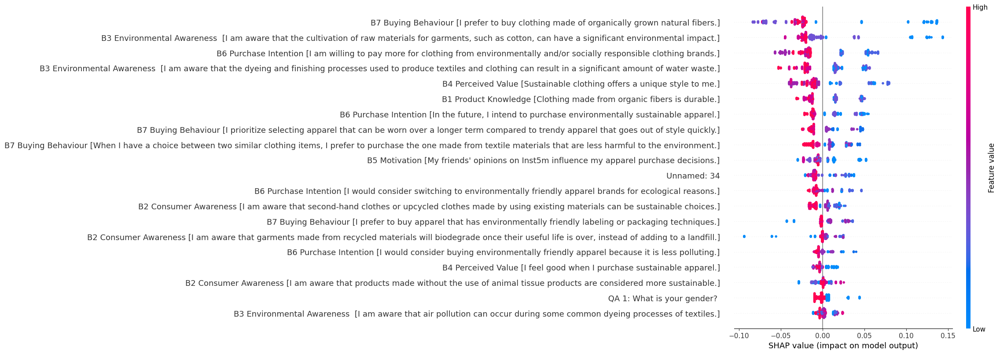

In [19]:
import matplotlib.pyplot as plt

# Assuming 'explainer' and 'shap_values' are already defined from the previous model training

# Generate a summary plot for the first model's SHAP values
shap.summary_plot(shap_values[1], X_train, feature_names=X_train.columns.tolist())

# save the plot
plt.savefig('/content/summary_plot.png', bbox_inches='tight')
plt.close()


Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


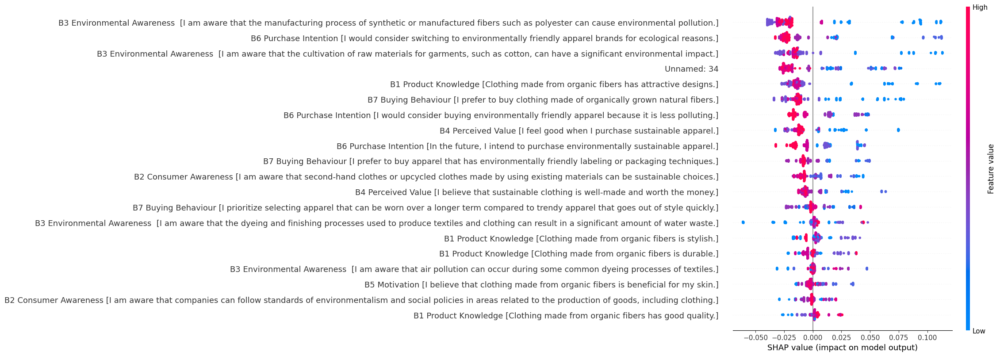

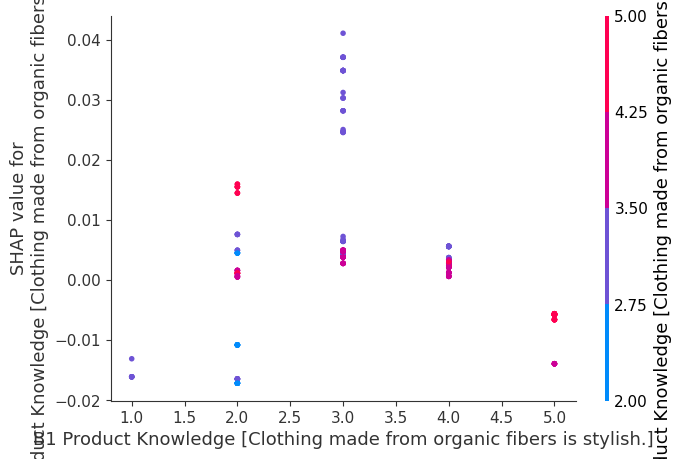

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


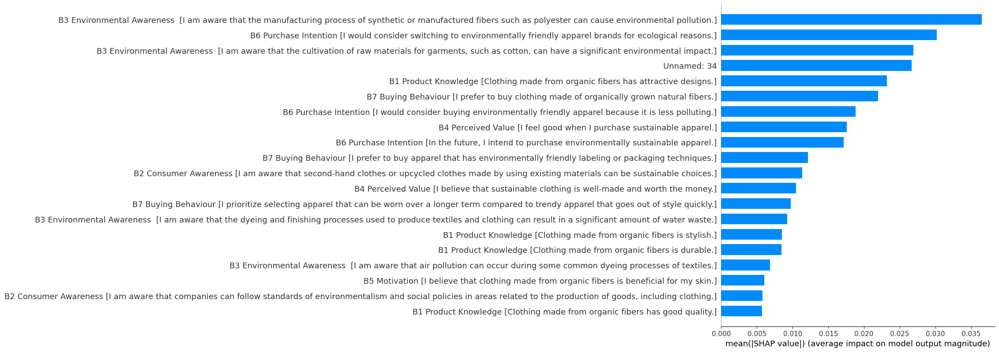

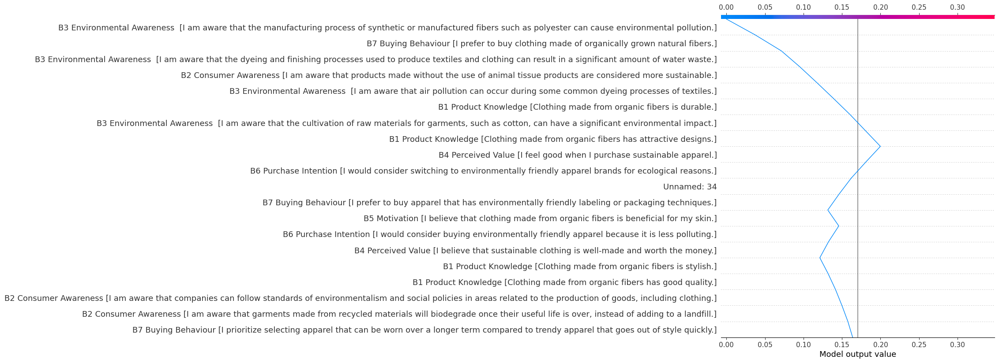

TypeError: ignored

In [21]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import shap
import matplotlib.pyplot as plt

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Drop columns with all NaN values and encode categorical variables
response_data.dropna(axis=1, how='all', inplace=True)

label_encoders = {}
for column in response_data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    response_data[column] = le.fit_transform(response_data[column].astype(str))
    label_encoders[column] = le

# Define the target variable (choose one for the example)
target = 'B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]'

# Split the dataset
X = response_data.drop(target, axis=1)
y = response_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest Model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
print("Model Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

# SHAP for Explainability
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# Initialize JavaScript visualization in Jupyter (if using Jupyter Notebook/Lab)
shap.initjs()

# Generate various SHAP visualizations

# Summary plot
shap.summary_plot(shap_values[1], X_train, feature_names=X_train.columns.tolist())

# Dependence plot for a specific feature (example: 'B1 Product Knowledge [Clothing made from organic fibers is stylish.]')
shap.dependence_plot('B1 Product Knowledge [Clothing made from organic fibers is stylish.]', shap_values[1], X_train, feature_names=X_train.columns.tolist())

# Bar plot of feature importances
shap.summary_plot(shap_values[1], X_train, plot_type="bar", feature_names=X_train.columns.tolist())

# Decision plot for a single prediction
shap.decision_plot(explainer.expected_value[1], shap_values[1][0,:], feature_names=X_train.columns.tolist())

# Waterfall plot for a single prediction
shap.plots.waterfall(shap_values[1][0], feature_names=X_train.columns.tolist(), max_display=10)  # max_display limits the number of features to show



Model for B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


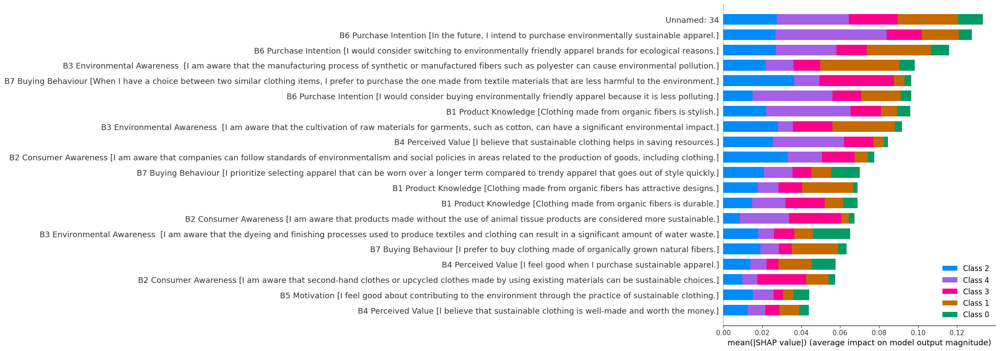

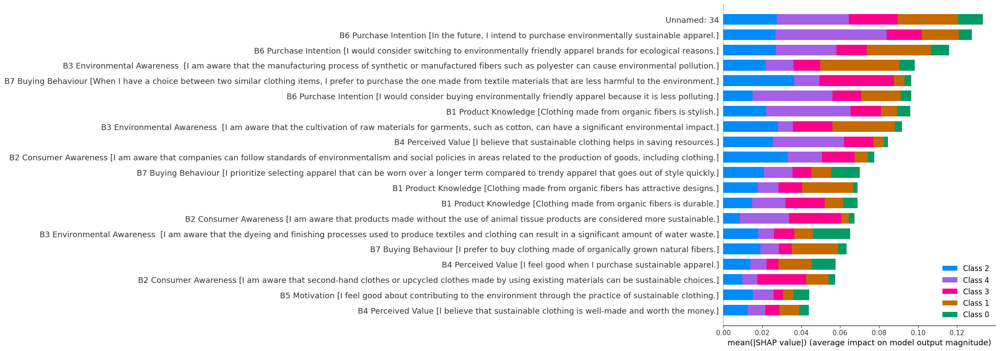

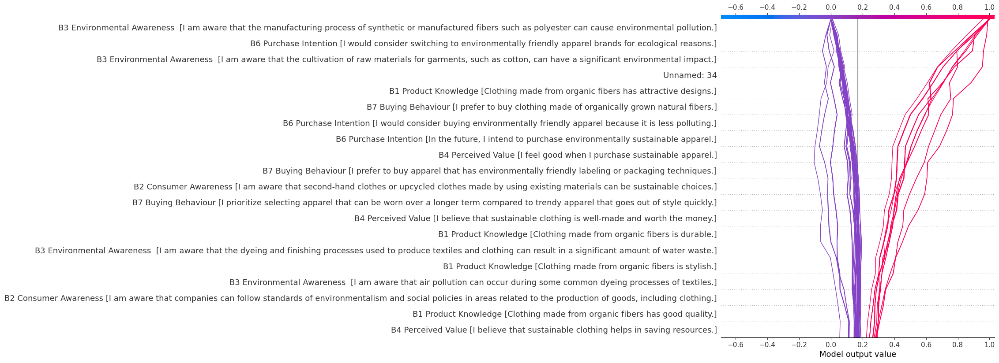

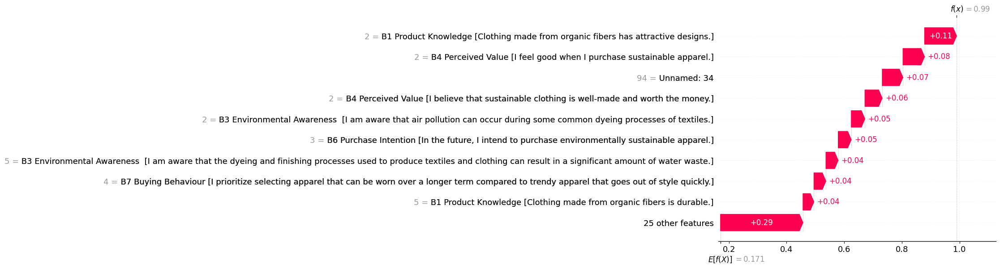


Model for B6 Purchase Intention [In the future, I intend to purchase environmentally sustainable apparel.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        25
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        27

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


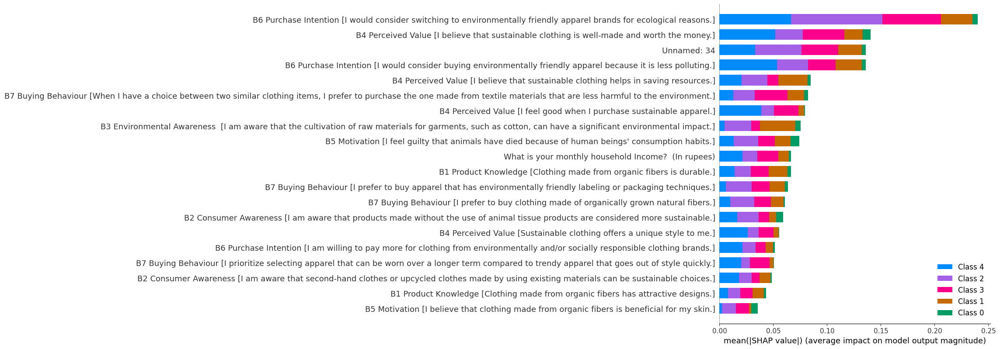

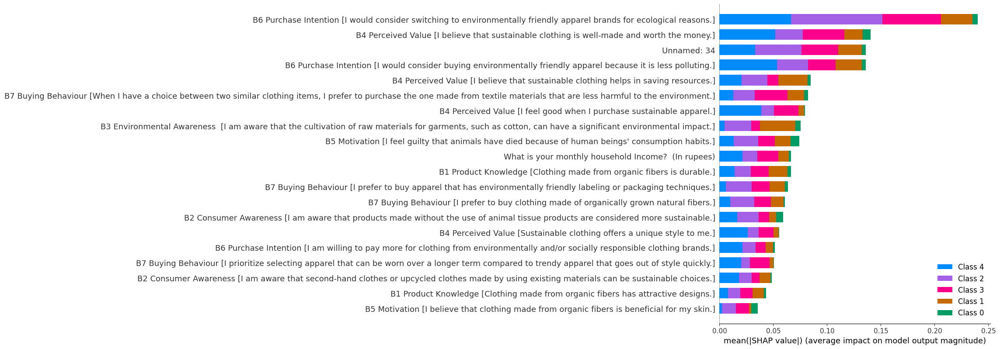

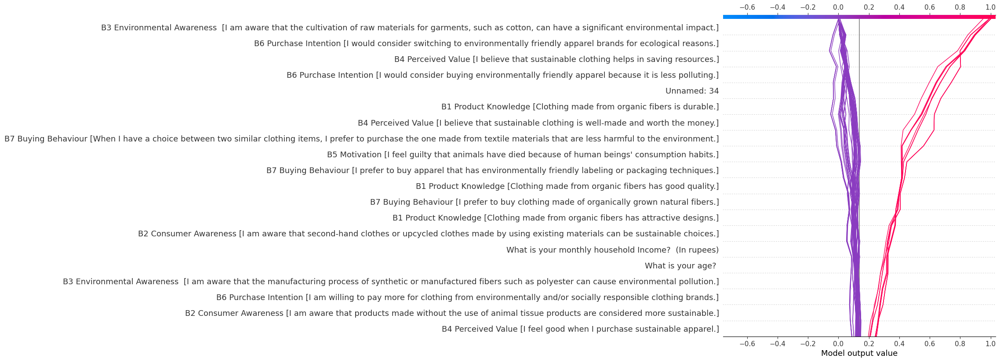

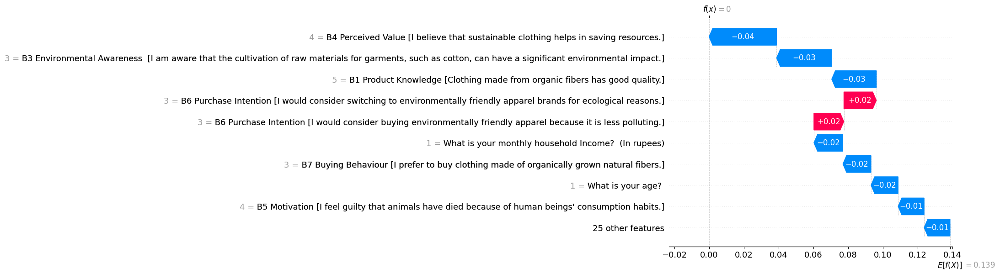


Model for B7 Buying Behaviour [When I have a choice between two similar clothing items, I prefer to purchase the one made from textile materials that are less harmful to the environment.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        27
           4       1.00      1.00      1.00        16
           5       1.00      1.00      1.00        21

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


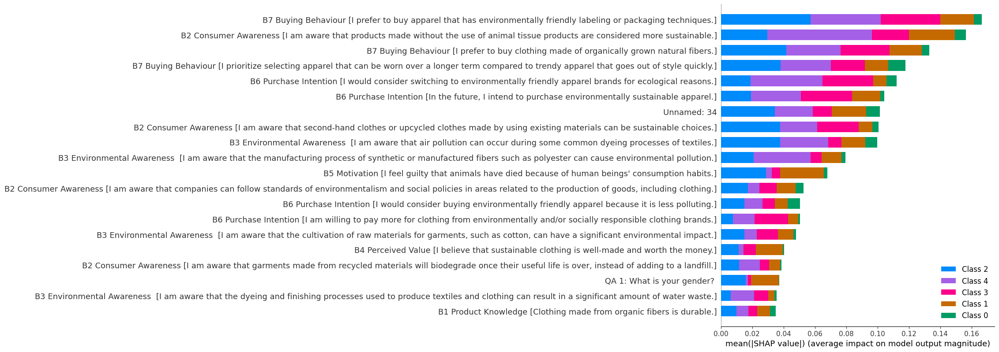

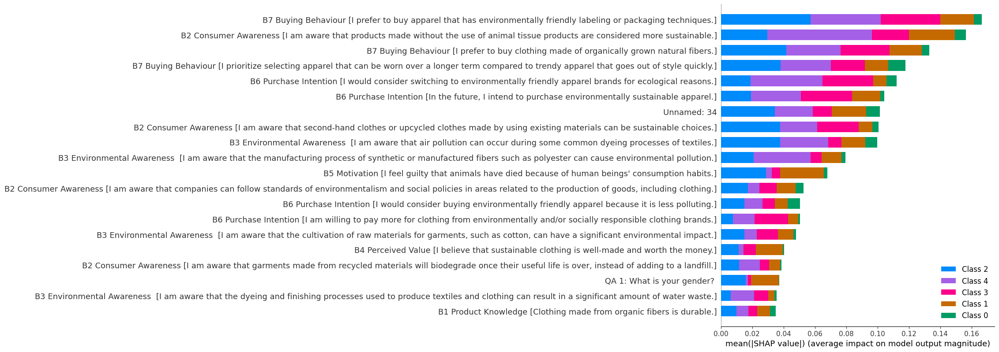

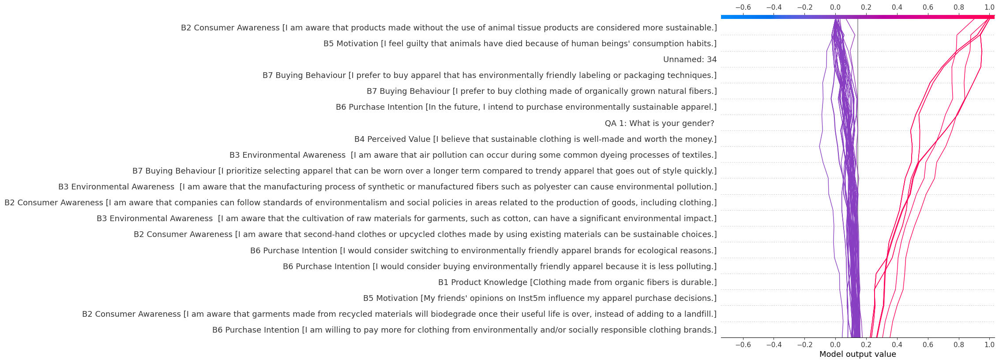

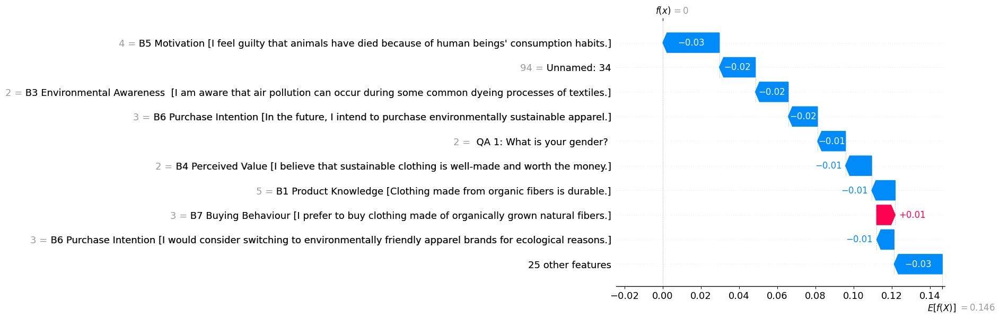


Model for B7 Buying Behaviour [I prefer to buy clothing made of organically grown natural fibers.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00        15
           3       1.00      1.00      1.00        22
           4       1.00      1.00      1.00        10
           5       1.00      1.00      1.00        29

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


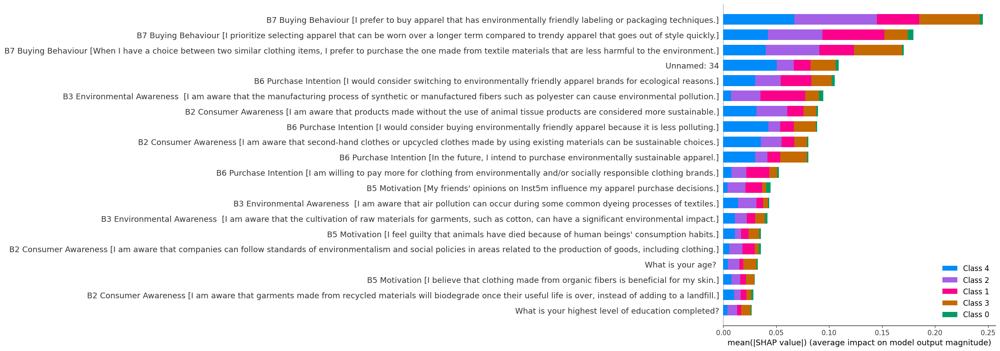

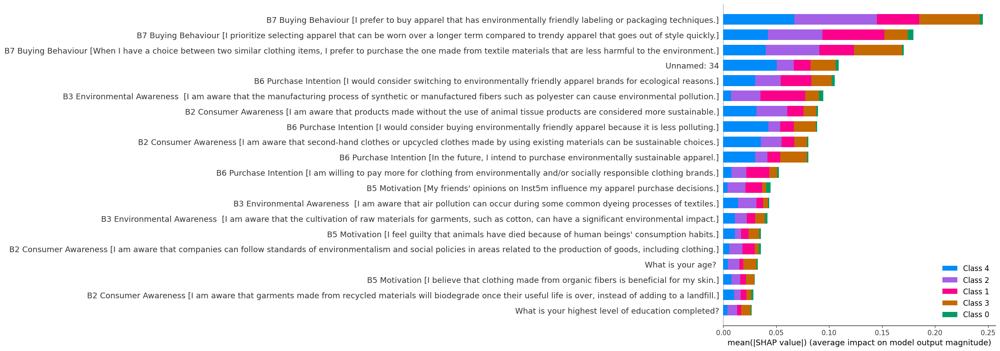

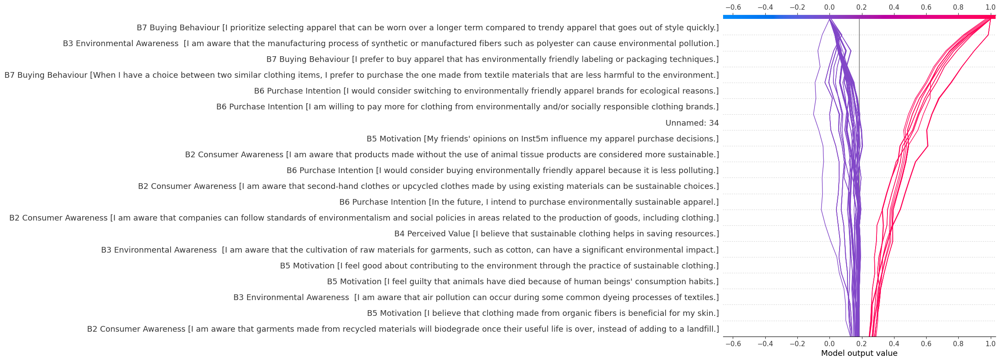

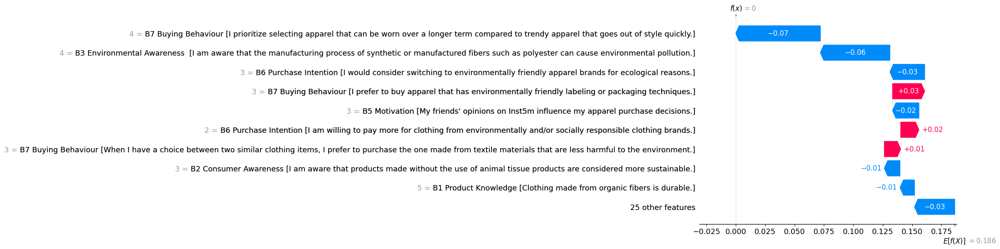


Model for B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        19
           4       1.00      1.00      1.00         8
           5       1.00      1.00      1.00        22

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


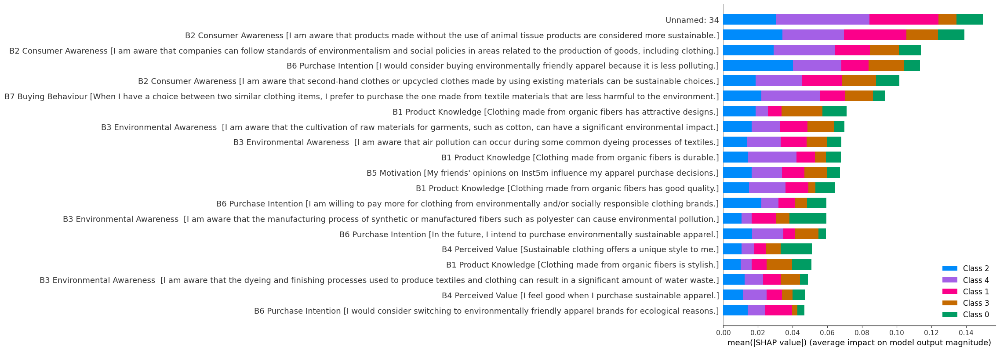

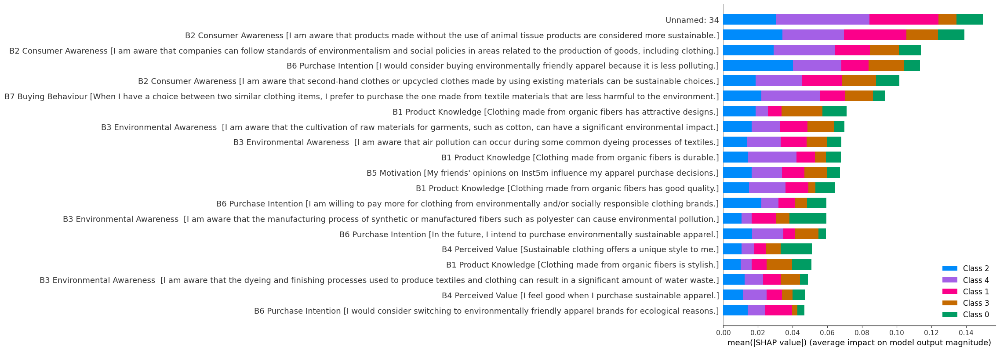

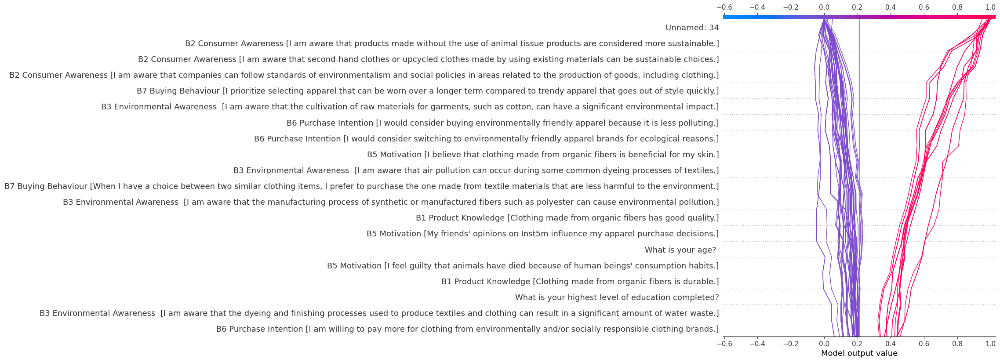

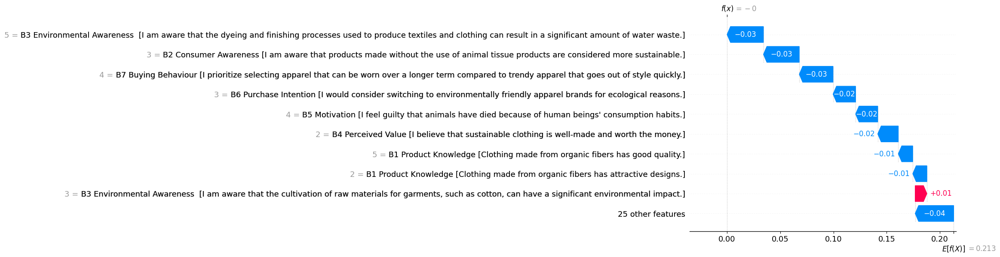


Model for B2 Consumer Awareness [I am aware that companies can follow standards of environmentalism and social policies in areas related to the production of goods, including clothing.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00        10
           3       1.00      1.00      1.00        18
           4       1.00      1.00      1.00        19
           5       1.00      1.00      1.00        23

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


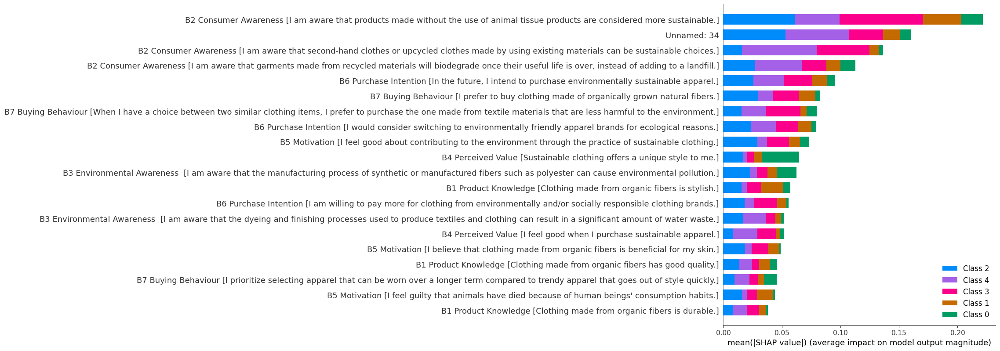

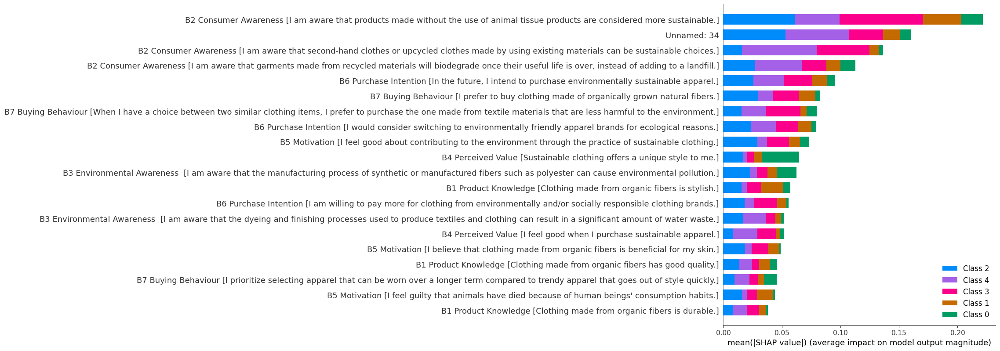

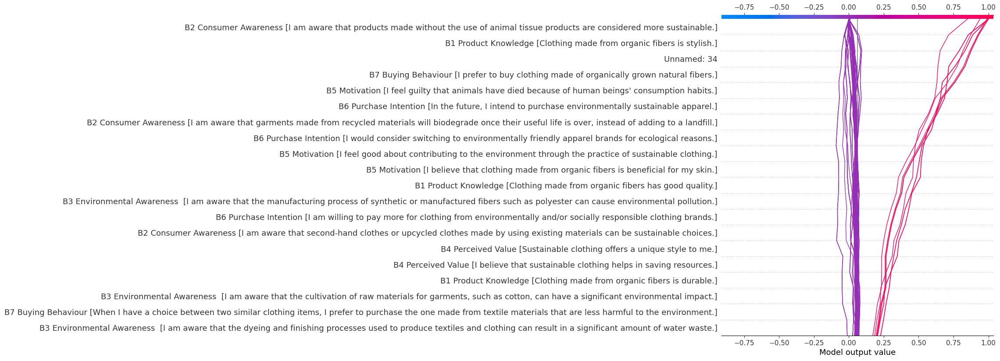

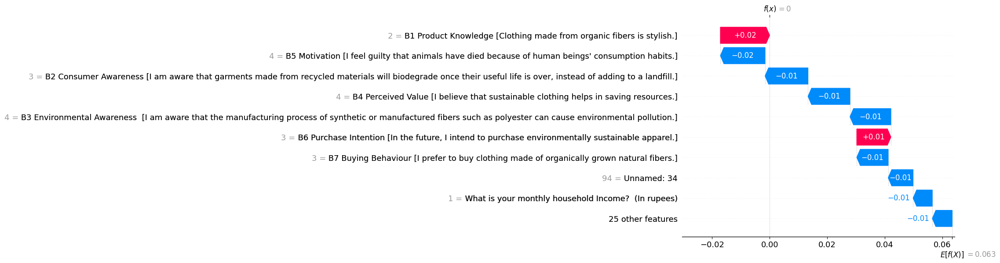


Model for B3 Environmental Awareness  [I am aware that the dyeing and finishing processes used to produce textiles and clothing can result in a significant amount of water waste.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           2       1.00      1.00      1.00         9
           3       1.00      1.00      1.00        30
           4       1.00      1.00      1.00        20
           5       1.00      1.00      1.00        18

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


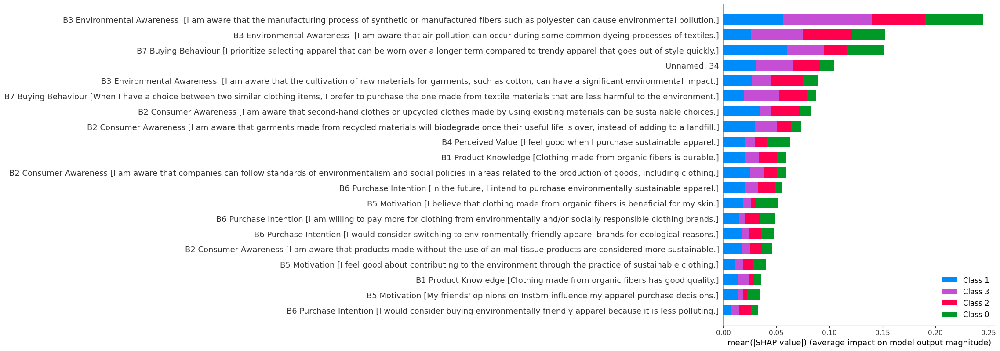

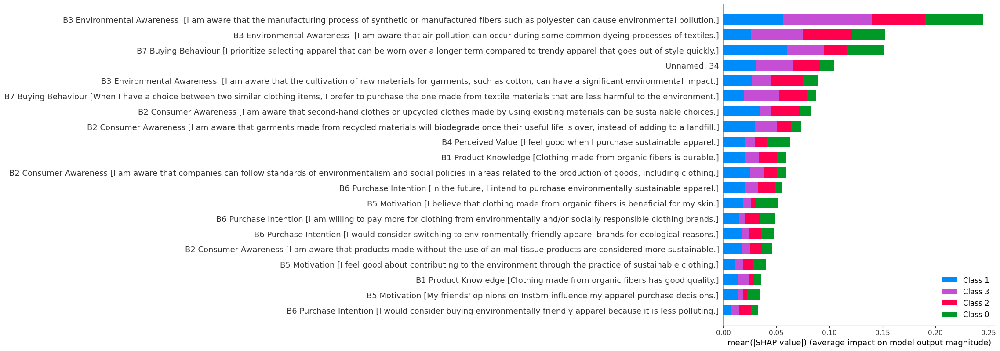

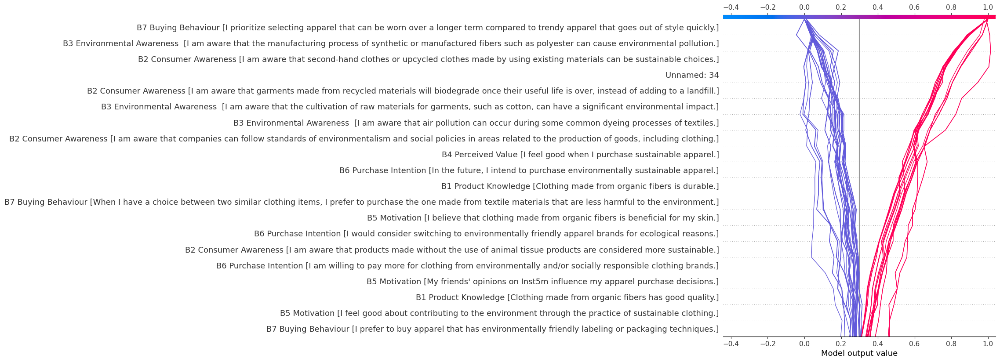

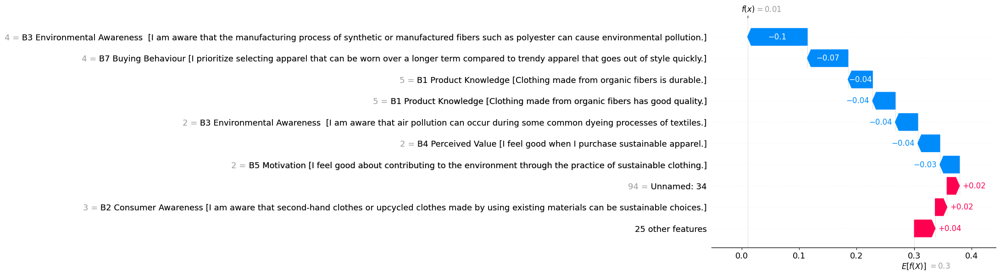


Model for B3 Environmental Awareness  [I am aware that the manufacturing process of synthetic or manufactured fibers such as polyester can cause environmental pollution.]
Model Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00         5
           2       1.00      1.00      1.00        18
           3       1.00      1.00      1.00        14
           4       1.00      1.00      1.00        12
           5       1.00      1.00      1.00        28

    accuracy                           1.00        77
   macro avg       1.00      1.00      1.00        77
weighted avg       1.00      1.00      1.00        77



Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


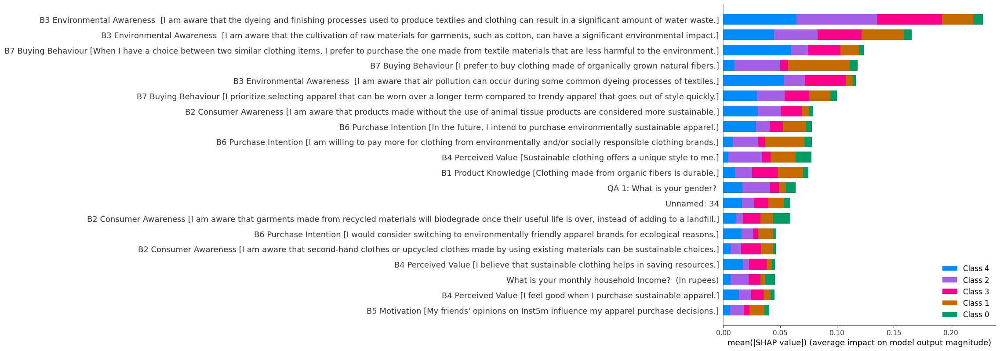

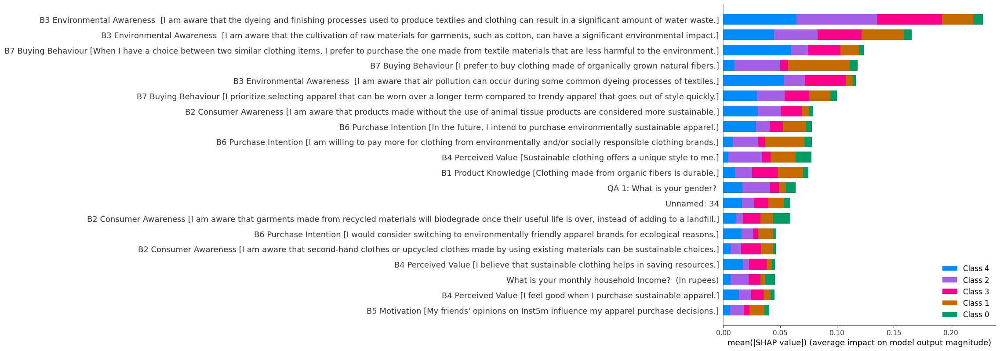

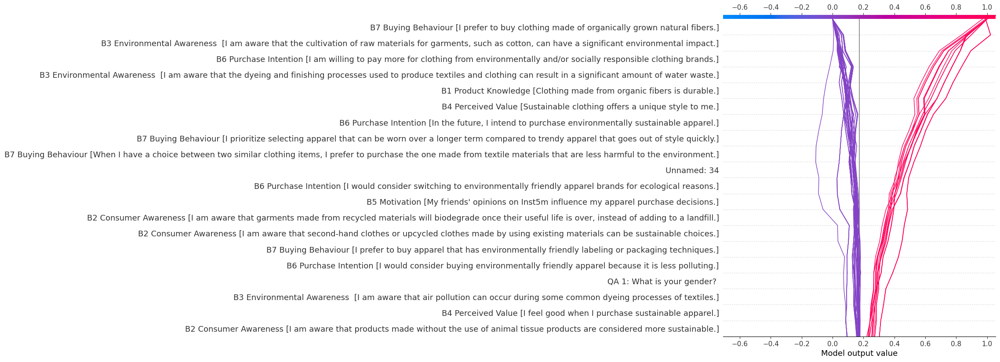

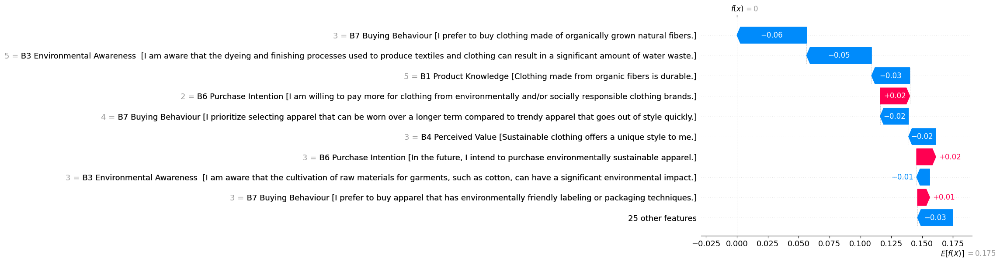

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import shap
import matplotlib.pyplot as plt

# Load the dataset
response_data = pd.read_excel('/content/Response.xlsx')

# Drop columns with all NaN values and encode categorical variables
response_data.dropna(axis=1, how='all', inplace=True)

label_encoders = {}
for column in response_data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    response_data[column] = le.fit_transform(response_data[column].astype(str))
    label_encoders[column] = le

# Define the target variables (as a list for looping through)
targets = [
    'B6 Purchase Intention [I am willing to pay more for clothing from environmentally and/or socially responsible clothing brands.]',
    'B6 Purchase Intention [In the future, I intend to purchase environmentally sustainable apparel.]',
    'B7 Buying Behaviour [When I have a choice between two similar clothing items, I prefer to purchase the one made from textile materials that are less harmful to the environment.]',
    'B7 Buying Behaviour [I prefer to buy clothing made of organically grown natural fibers.]',
    'B2 Consumer Awareness [I am aware that garments made from recycled materials will biodegrade once their useful life is over, instead of adding to a landfill.]',
    'B2 Consumer Awareness [I am aware that companies can follow standards of environmentalism and social policies in areas related to the production of goods, including clothing.]',
    'B3 Environmental Awareness  [I am aware that the dyeing and finishing processes used to produce textiles and clothing can result in a significant amount of water waste.]',
    'B3 Environmental Awareness  [I am aware that the manufacturing process of synthetic or manufactured fibers such as polyester can cause environmental pollution.]'
]

# Initialize JavaScript visualization in Jupyter (if using Jupyter Notebook/Lab)
shap.initjs()

# Loop through each target variable and build a model
for target in targets:
    print(f"\nModel for {target}")

    # Split the dataset
    X = response_data.drop(columns=target)
    y = response_data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the Random Forest Model
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train, y_train)

    # Evaluate the model
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred)
    print("Model Accuracy:", accuracy)
    print("Classification Report:\n", classification_rep)

    # SHAP for Explainability
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_test)

    # Generate various SHAP visualizations for the first model

    # Summary plot
    shap.summary_plot(shap_values, X_test, feature_names=X_test.columns.tolist())

    # Bar plot of feature importances
    shap.summary_plot(shap_values, X_test, plot_type="bar", feature_names=X_test.columns.tolist())

    # Decision plot for a single prediction
    shap.decision_plot(explainer.expected_value[1], shap_values[1], X_test, feature_names=X_test.columns.tolist())

    # Waterfall plot for a single prediction
    # We create an Explanation object for the first prediction in the test set
    instance_shap_values = shap.Explanation(values=shap_values[1][0],
                                            base_values=explainer.expected_value[1],
                                            data=X_test.iloc[0,:],
                                            feature_names=X_test.columns.tolist())
    shap.waterfall_plot(instance_shap_values)
